# 02 - Modelo YOLO

*   Juan Sebastian Fajardo Zarta
*   Andres Felipe Parra Barragan

In [ ]:
#Con esta precisión mixta se optimiza el uso de la GPU, mejorando el rendimiento y reduciendo el uso de memoria
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')

# Descarga del conjunto de datos
Se usa *kagglehub* para descargar el conjunto de datos desde Kaggle titulado *traffic-detection-project* del usuario *yusufberksardoan*. Este conjunto contiene imágenes de tráfico con sus respectivas etiquetas en formato .txt, y se organizan los datos en tres categorías comunes para el proyecto de aprendizaje automático: train, test y valid;entrenamiento, prueba y validación respectivamente.

In [ ]:
# Import necessary libraries
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import kagglehub

# Step 1: Download the dataset
path = kagglehub.dataset_download("yusufberksardoan/traffic-detection-project")
print("Path to dataset files:", path)

# Step 2: Set paths for train, validation, and test sets
train_dir = os.path.join(path, 'train')
val_dir = os.path.join(path, 'valid')
test_dir = os.path.join(path, 'test')

# Paths for images and labels
def get_image_label_paths(base_dir):
    images_dir = os.path.join(base_dir, 'images')
    labels_dir = os.path.join(base_dir, 'labels')
    return images_dir, labels_dir

train_images_dir, train_labels_dir = get_image_label_paths(train_dir)
val_images_dir, val_labels_dir = get_image_label_paths(val_dir)
test_images_dir, test_labels_dir = get_image_label_paths(test_dir)


100%|██████████| 583M/583M [00:26<00:00, 23.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/yusufberksardoan/traffic-detection-project/versions/1


In [ ]:
def get_image_label_pairs(images_dir, labels_dir):
    """
    Ensure proper alignment of images and labels by matching file prefixes.
    """
    image_files = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
    label_files = sorted([f for f in os.listdir(labels_dir) if f.endswith('.txt')])

    # Extract prefixes (everything before the extension)
    image_prefixes = {os.path.splitext(f)[0] for f in image_files}
    label_prefixes = {os.path.splitext(f)[0] for f in label_files}

    # Only include matched pairs
    matched_pairs = []
    for prefix in image_prefixes.intersection(label_prefixes):
        matched_pairs.append((
            os.path.join(images_dir, f"{prefix}.jpg"),
            os.path.join(labels_dir, f"{prefix}.txt"),
        ))

    # Sort matched pairs for deterministic order
    matched_pairs = sorted(matched_pairs)
    return matched_pairs


# Procesamiento de imágenes y etiquetas, conjunto de datos
Las imágenes se cargan y se redimensionan a 640x640 píxeles. Luego se normalizan de [0,1]. Las etiquetas son preprocesadas para que se ajusten al formato de la cuadrícula de YOLO. Se toma la información de clase, el centro de la caja, el ancho y la altura, y se organiza en una cuadrícula de 20x20. Esto se almacena en una matriz *y_true*, que es la salida esperada para la red. Se define la función *create_dataset* que genera un conjunto de datos de entrenamiento a partir de las imágenes y etiquetas procesadas con un tabaño de batch de 4. Utiliza tf.data para optimizar el rendimiento.

In [ ]:
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, (640, 640))  # Resize to the expected size
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] range
    return image

In [ ]:
# Updated preprocess_label function
def preprocess_label(label_path, grid_size=20, num_classes=5, num_anchors=3):
    """
    Preprocess labels to match YOLO grid format.
    """
    labels = tf.io.read_file(label_path)
    labels = tf.strings.split(labels, '\n')
    labels = tf.strings.to_number(tf.strings.split(labels).values)
    labels = tf.reshape(labels, [-1, 5])  # [class_id, x_center, y_center, width, height]

    # Create an empty grid
    y_true = np.zeros((grid_size, grid_size, num_anchors, 5 + num_classes), dtype=np.float32)

    for label in labels:
        class_id, x_center, y_center, width, height = label.numpy()
        grid_x = int(x_center * grid_size)
        grid_y = int(y_center * grid_size)
        anchor = 0

        # Fill in the grid cell
        y_true[grid_y, grid_x, anchor, 0:4] = [x_center, y_center, width, height]
        y_true[grid_y, grid_x, anchor, 4] = 1.0  # Objectness
        y_true[grid_y, grid_x, anchor, 5 + int(class_id)] = 1.0  # One-hot class label

    y_true_tensor = tf.convert_to_tensor(y_true)
    y_true_tensor.set_shape([grid_size, grid_size, num_anchors, 5 + num_classes])  # Set static shape
    return y_true_tensor

In [ ]:
def create_dataset(images_dir, labels_dir, batch_size=4):
    # Get aligned image-label pairs
    paired_data = get_image_label_pairs(images_dir, labels_dir)

    # Separate paths
    image_paths, label_paths = zip(*paired_data)

    dataset = tf.data.Dataset.from_tensor_slices((list(image_paths), list(label_paths)))

    def preprocess_sample(image_path, label_path):
        image = preprocess_image(image_path)
        labels = tf.py_function(preprocess_label, [label_path], tf.float32)
        labels.set_shape([20, 20, 3, 10])  # Explicitly set shape
        return image, labels

    dataset = dataset.map(preprocess_sample)
    return dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)


In [ ]:
# Create datasets
train_dataset = create_dataset(train_images_dir, train_labels_dir)
val_dataset = create_dataset(val_images_dir, val_labels_dir)

In [ ]:
# debug labels raw
import os
label_sample = os.path.join(train_labels_dir, os.listdir(train_labels_dir)[0])
with open(label_sample, 'r') as f:
    print(f"Raw label data for {label_sample}:")
    print(f.read())


Raw label data for /root/.cache/kagglehub/datasets/yusufberksardoan/traffic-detection-project/versions/1/train/labels/ant_sales-2120_png_jpg.rf.9f10581190a424f41fca94e56a26c0ce.txt:
3 0.3375 0.4359375 0.0296875 0.1421875
3 0.7796875 0.19140625 0.0390625 0.1203125
3 0.79296875 0.11328125 0.0265625 0.1140625
0 0.890625 0.35078125 0.096875 0.146875
3 0.8765625 0.1140625 0.034375 0.115625
3 0.915625 0.08203125 0.025 0.10625


# Visualización de las cajas de delimitación

Esta función visualiza las cajas de delimitación de la (ground truth) sobre una imagen, utilizando los datos de las etiquetas correspondientes. Las etiquetas son procesadas y convertidas a coordenadas absolutas (en píxeles) basadas en la cuadrícula de la imagen. Luego, se muestra la imagen con las cajas de delimitación correspondientes a cada objeto en la imagen, con su respectiva clase.

Visualizing ground truth for image: /root/.cache/kagglehub/datasets/yusufberksardoan/traffic-detection-project/versions/1/train/images/aguanambi-1000_png_jpg.rf.0ab6f274892b9b370e6441886b2d7b9d.jpg
Corresponding label: /root/.cache/kagglehub/datasets/yusufberksardoan/traffic-detection-project/versions/1/train/labels/aguanambi-1000_png_jpg.rf.0ab6f274892b9b370e6441886b2d7b9d.txt
Label Content for /root/.cache/kagglehub/datasets/yusufberksardoan/traffic-detection-project/versions/1/train/labels/aguanambi-1000_png_jpg.rf.0ab6f274892b9b370e6441886b2d7b9d.txt:
0 0.4984375 0.9078125 0.0453125 0.18125
0 0.5375 0.86640625 0.0390625 0.16875
3 0.63671875 0.27421875 0.021875 0.0765625
4 0.89296875 0.4421875 0.209375 0.2453125
2 0.7765625 0.27265625 0.0640625 0.0859375
2 0.57578125 0.2046875 0.0390625 0.0671875
2 0.63359375 0.20546875 0.0390625 0.0703125
2 0.59765625 0.16328125 0.034375 0.0578125
2 0.646875 0.1703125 0.0390625 0.0609375
2 0.615625 0.12890625 0.0328125 0.0515625
2 0.65625 0.1265625

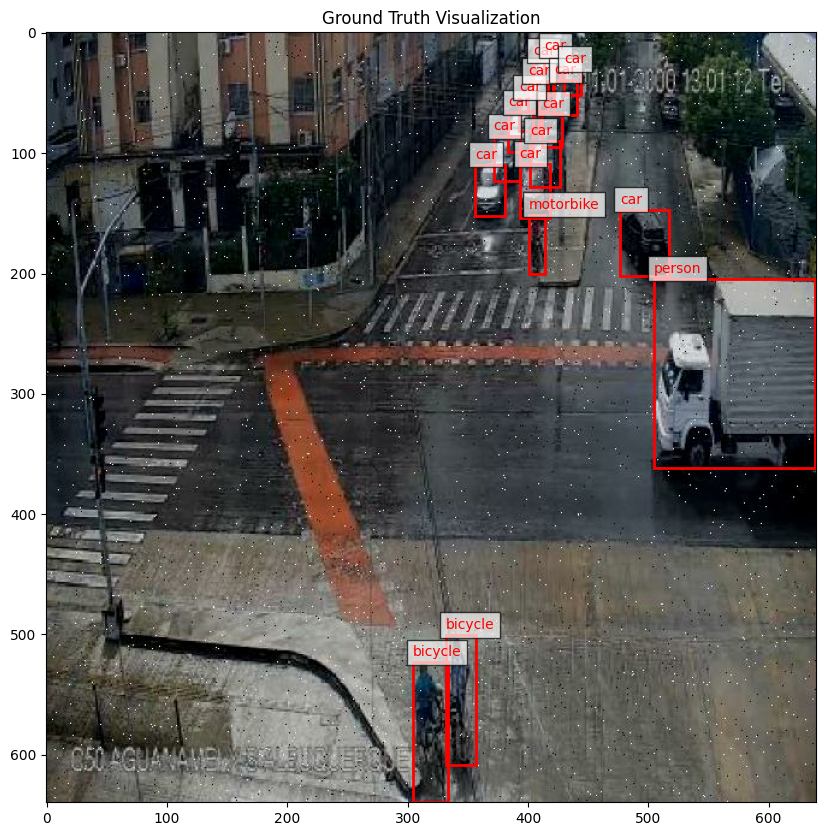

In [ ]:
def visualize_ground_truth(image_path, label_path, grid_size=20, img_size=640, class_names=None):
    """
    Visualizes the ground truth bounding boxes over the image.
    """
    if class_names is None:
        class_names = ['bicycle', 'bus', 'car', 'motorbike', 'person']

    # Print file names
    print(f"Visualizing ground truth for image: {image_path}")
    print(f"Corresponding label: {label_path}")

    # Print label content
    with open(label_path, 'r') as file:
        raw_labels = file.readlines()
    print(f"Label Content for {label_path}:\n{''.join(raw_labels)}")

    # Preprocess image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, (img_size, img_size))
    image = tf.cast(image, tf.uint8).numpy()

    # Process labels for visualization
    labels = []
    for line in raw_labels:
        components = list(map(float, line.strip().split()))
        class_id, x_center, y_center, width, height = components
        x_min = (x_center - width / 2) * img_size
        y_min = (y_center - height / 2) * img_size
        x_max = (x_center + width / 2) * img_size
        y_max = (y_center + height / 2) * img_size
        labels.append((x_min, y_min, x_max, y_max, int(class_id)))

    # Plot image with bounding boxes
    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image)
    ax.set_title("Ground Truth Visualization")

    for (x_min, y_min, x_max, y_max, class_id) in labels:
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                  linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, f"{class_names[class_id]}", color='red', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7))
    plt.show()

# Visualize ground truth for one sample from the dataset
for image_path, label_path in get_image_label_pairs(train_images_dir, train_labels_dir)[:1]:  # Visualize 1 pair
    visualize_ground_truth(image_path, label_path)


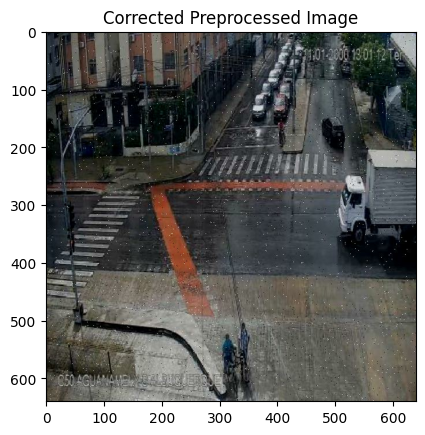

In [ ]:
# check no artifacts on
for images, _ in train_dataset.take(1):
    plt.imshow(images[0].numpy())
    plt.title("Corrected Preprocessed Image")
    plt.show()


In [ ]:
for images, labels in train_dataset.take(1):
    print("Label shape:", labels.shape)  # Should be (batch_size, 20, 20, 3, 10)


Label shape: (4, 20, 20, 3, 10)


# Modelo YOLO simplificado
Se define un modelo básico de YOLO utilizando Keras. Este modelo tiene varias capas convolucionales que extraen características de la imagen, seguidas de capas densas que realizan la predicción de las cajas delimitadoras para cada celda de la cuadrícula, prediciendo la clase, el centro y el tamaño de cada objeto. Para entrenar al modelo, se compila con el optimizador Adam y la función de pérdida MSE (Error Cuadrático Medio). Y se entrena con los datos de entrenamiento y validación.

In [ ]:
def build_yolo_model(grid_size=20, num_classes=5, num_anchors=3, input_shape=(640, 640, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Backbone
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)

    # Fully connected layers for predictions
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    outputs = tf.keras.layers.Dense(grid_size * grid_size * num_anchors * (5 + num_classes))(x)
    outputs = tf.keras.layers.Reshape((grid_size, grid_size, num_anchors, 5 + num_classes))(outputs)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

# Model Compilation and Training
model = build_yolo_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='mse')  # should be changed for mAP
model.fit(train_dataset, validation_data=val_dataset, epochs=2)

Epoch 1/2
1452/1452 ━━━━━━━━━━━━━━━━━━━━ 262s 164ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2/2
1452/1452 ━━━━━━━━━━━━━━━━━━━━ 231s 158ms/step - loss: 0.0025 - val_loss: 0.0022


# Predicciones
Una vez entrenado, el modelo realiza predicciones que se decodifican para obtener las coordenadas de las cajas delimitadoras. Se aplica un umbral de confianza para filtrar las predicciones de baja probabilidad. Después de obtener las predicciones, se aplica el algoritmo de Supresión de No Máximos (NMS) para eliminar las cajas que se solapan demasiado. Esto mejora la precisión de las predicciones finales. Finalmente se implementa una función para mostrar las predicciones en una imagen, con las cajas delimitadoras sobrepuestas.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


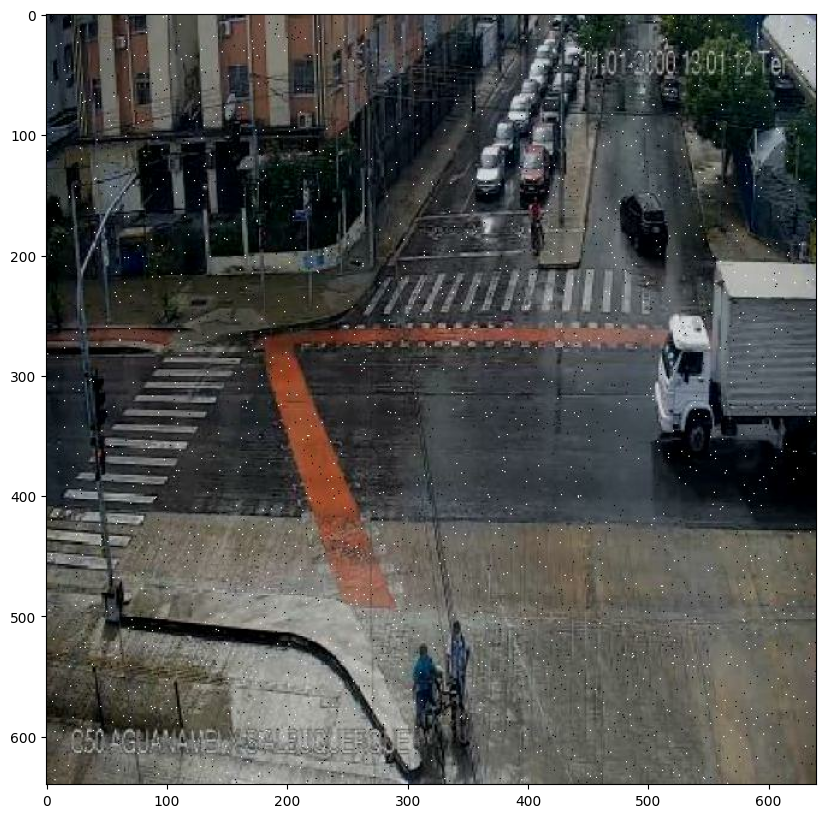

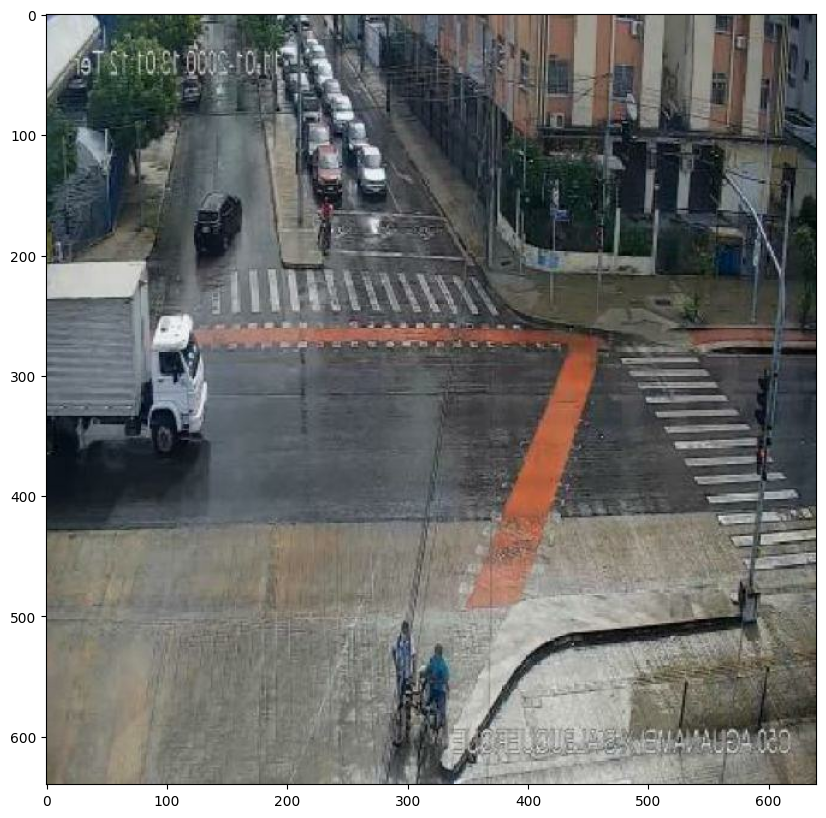

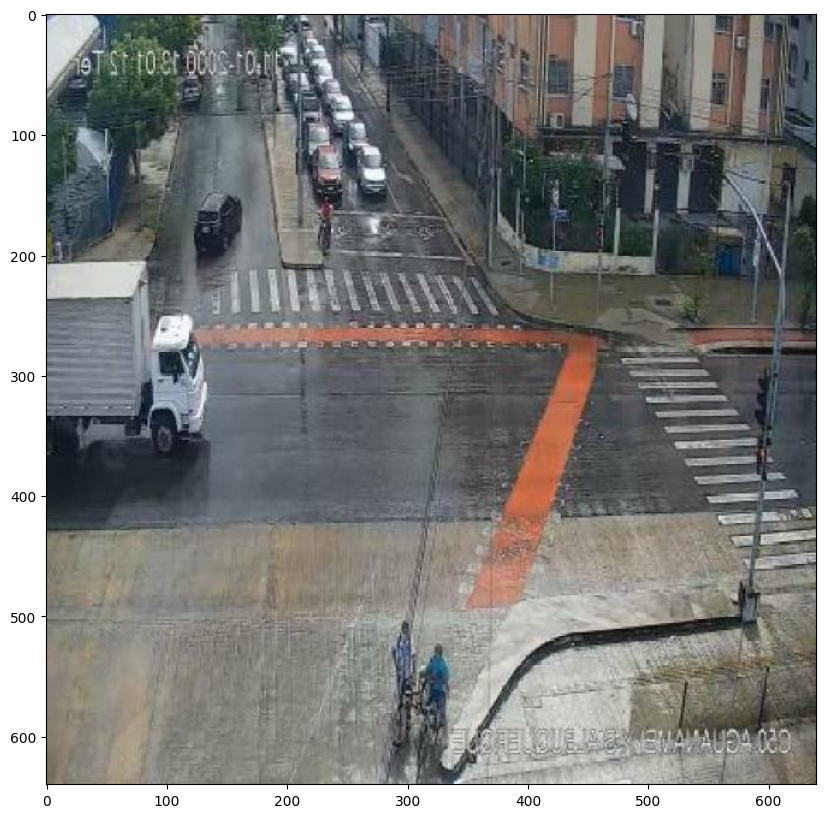

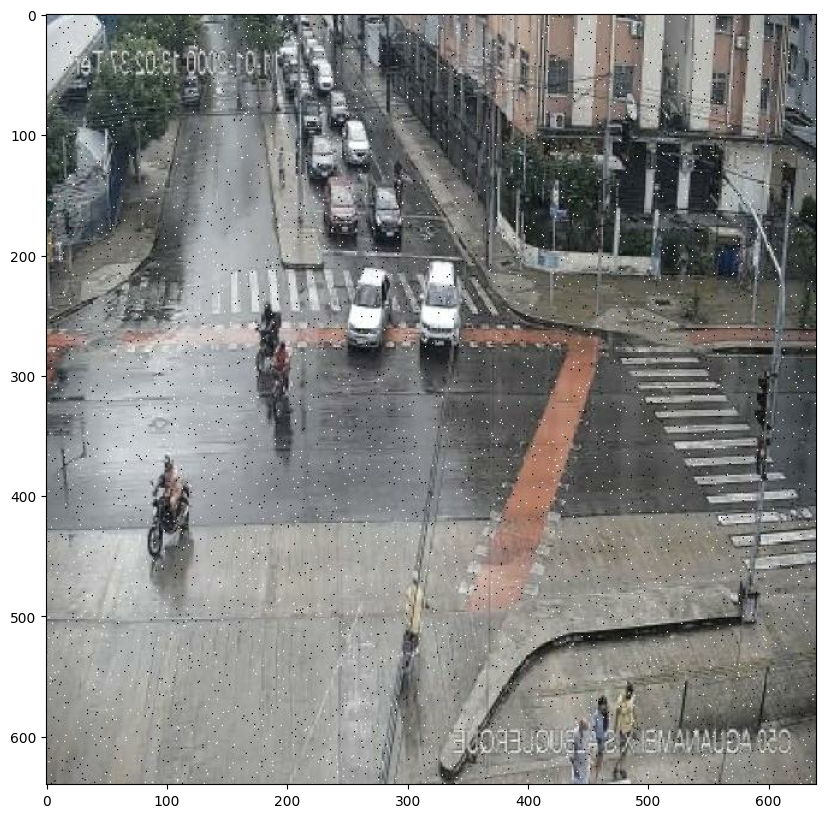

In [ ]:
# Decode predictions
def decode_predictions(predictions, grid_size=20, num_classes=5, img_size=640, score_threshold=0.5):
    """
    Decode YOLO predictions into bounding box coordinates, confidence, and class predictions.
    """
    boxes = []
    cell_size = img_size / grid_size

    for i in range(grid_size):
        for j in range(grid_size):
            for anchor in range(predictions.shape[2]):
                pred = predictions[i, j, anchor]
                x_center, y_center, width, height, obj_conf = pred[:5]
                class_probs = pred[5:]
                class_id = tf.argmax(class_probs)
                confidence = obj_conf * tf.reduce_max(class_probs)

                if confidence < score_threshold:
                    continue  # Skip low-confidence boxes

                # Convert YOLO grid coordinates to absolute image coordinates
                x_min = (x_center + j) * cell_size - (width * img_size) / 2
                y_min = (y_center + i) * cell_size - (height * img_size) / 2
                x_max = (x_center + j) * cell_size + (width * img_size) / 2
                y_max = (y_center + i) * cell_size + (height * img_size) / 2

                boxes.append([x_min, y_min, x_max, y_max, confidence, class_id.numpy()])
    return tf.convert_to_tensor(boxes)

# Apply Non-Maximum Suppression (NMS)
def non_max_suppression(boxes, iou_threshold=0.5):
    """
    Apply NMS to filter overlapping boxes based on IoU.
    """
    if len(boxes) == 0:
        return boxes

    x_min = boxes[:, 0]
    y_min = boxes[:, 1]
    x_max = boxes[:, 2]
    y_max = boxes[:, 3]
    confidences = boxes[:, 4]

    indices = tf.image.non_max_suppression(
        boxes[:, :4], confidences, max_output_size=50, iou_threshold=iou_threshold
    )

    return tf.gather(boxes, indices)

# Plot predictions on images
def plot_predictions(image, boxes, class_names):
    """
    Plot image with predicted bounding boxes.
    Args:
        image: Image as a numpy array.
        boxes: Tensor of shape [num_boxes, 6] with [x_min, y_min, x_max, y_max, confidence, class_id].
        class_names: List of class names for the dataset.
    """
    # Ensure image is in [0, 1] range for matplotlib
    if image.max() > 1.0:
        image = image / 255.0

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image)

    for box in boxes:
        x_min, y_min, x_max, y_max, confidence, class_id = box
        # Ensure box coordinates are within the image bounds
        x_min = max(0, x_min)
        y_min = max(0, y_min)
        x_max = min(image.shape[1], x_max)
        y_max = min(image.shape[0], y_max)

        # Draw the bounding box
        rect = patches.Rectangle(
            (x_min, y_min), x_max - x_min, y_max - y_min,
            linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)

        # Add label with confidence score
        ax.text(
            x_min, y_min - 5,
            f"{class_names[int(class_id)]}: {confidence:.2f}",
            color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.5)
        )
    plt.show()


# Class names
class_names = ['bicycle', 'bus', 'car', 'motorbike', 'person']

# Visualize predictions on the test dataset
for images, _ in train_dataset.take(1):  # Take one batch from the test dataset
    predictions = model.predict(images)
    for i in range(len(images)):
        decoded_boxes = decode_predictions(predictions[i], grid_size=10, num_classes=5, img_size=640)
        final_boxes = non_max_suppression(decoded_boxes)
        plot_predictions(images[i].numpy(), final_boxes.numpy(), class_names)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Visualizing predictions for train dataset, image 1


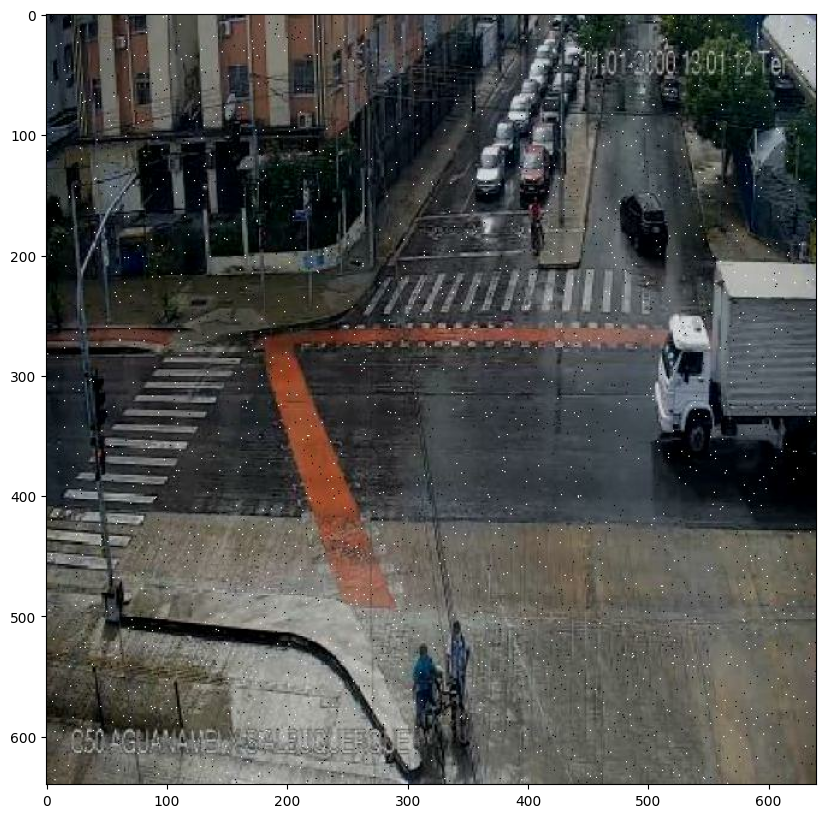

Visualizing predictions for train dataset, image 2


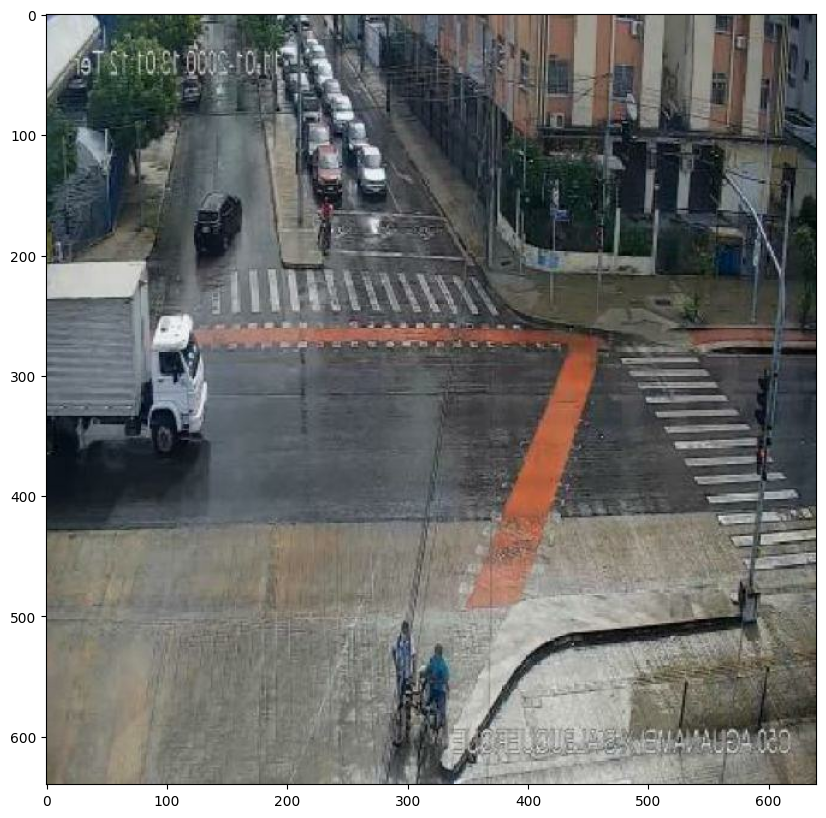

Visualizing predictions for train dataset, image 3


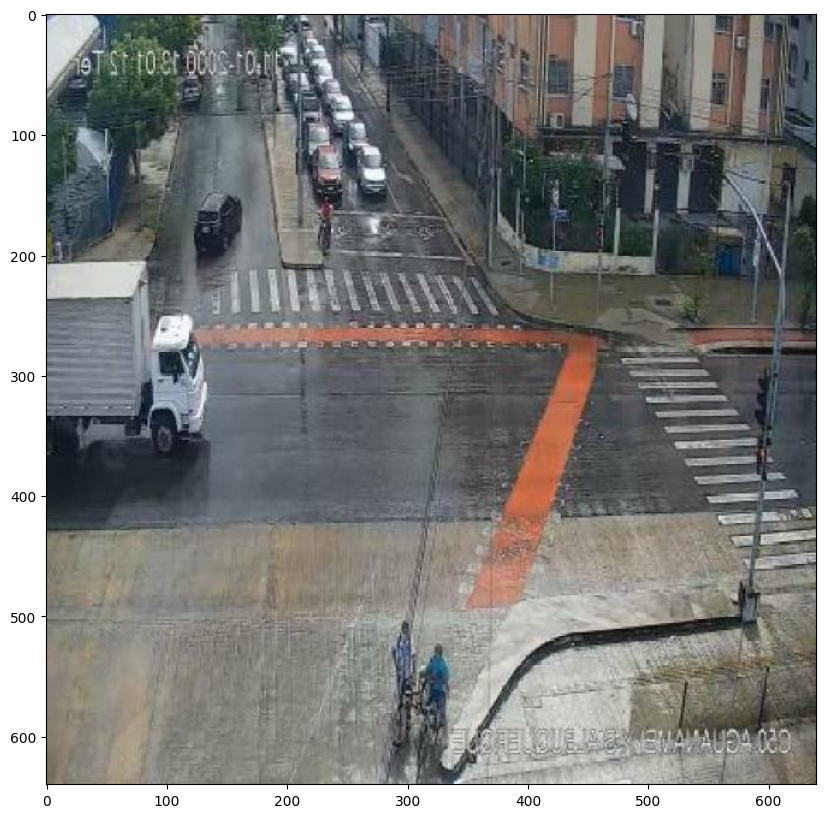

Visualizing predictions for train dataset, image 4


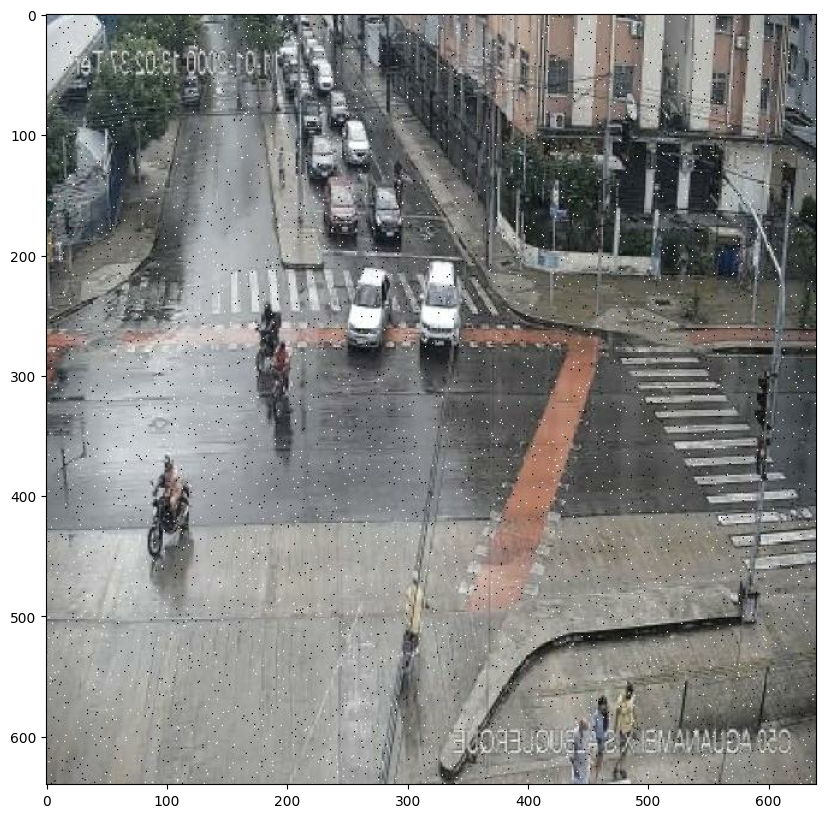

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Visualizing predictions for val dataset, image 1


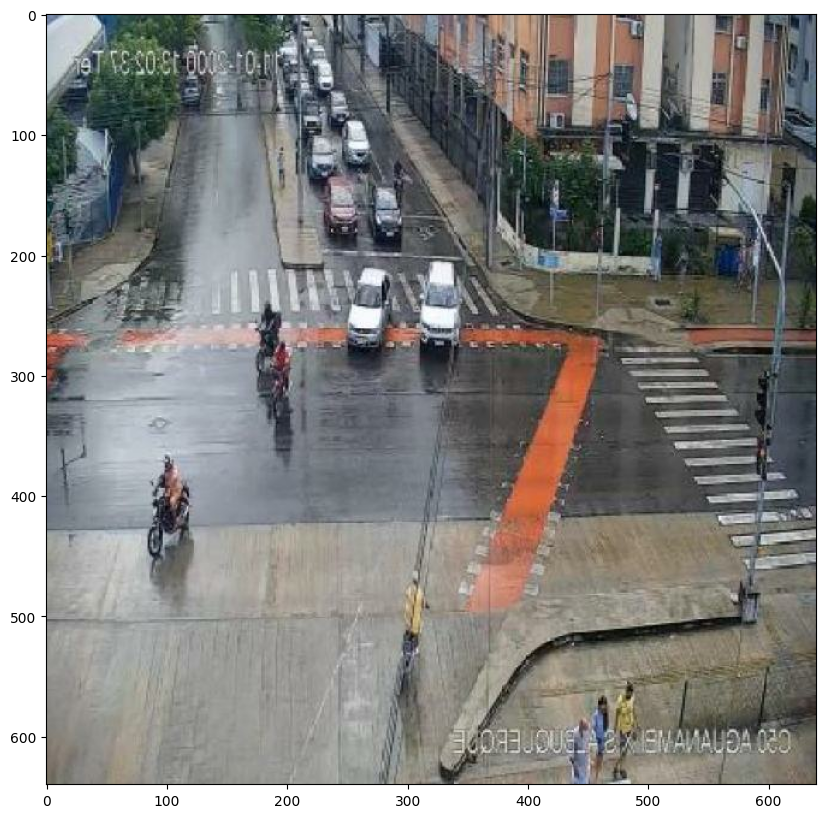

Visualizing predictions for val dataset, image 2


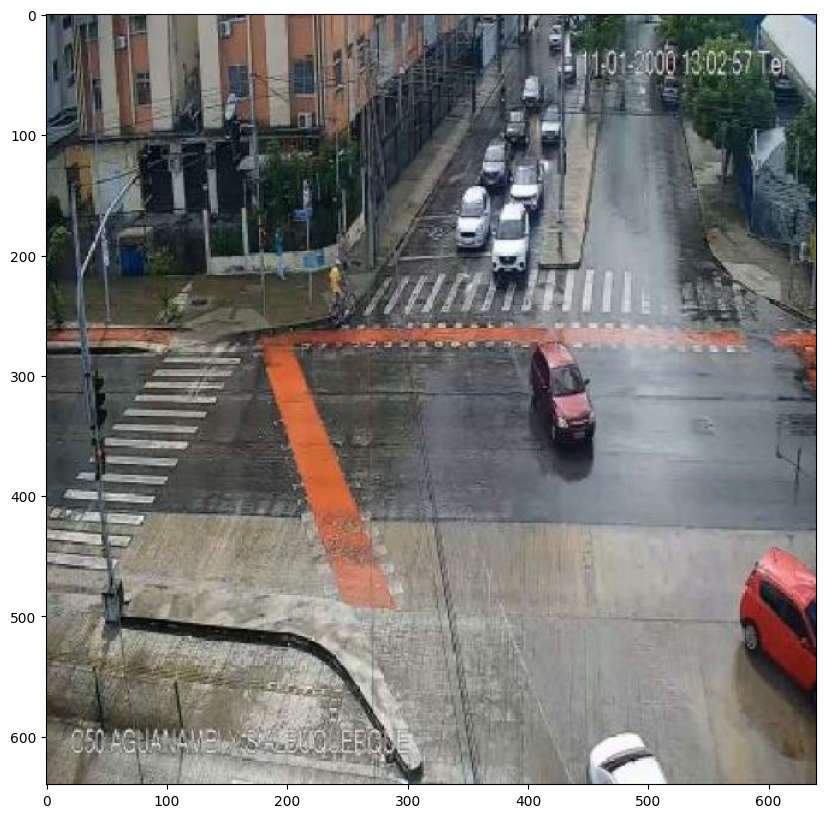

Visualizing predictions for val dataset, image 3


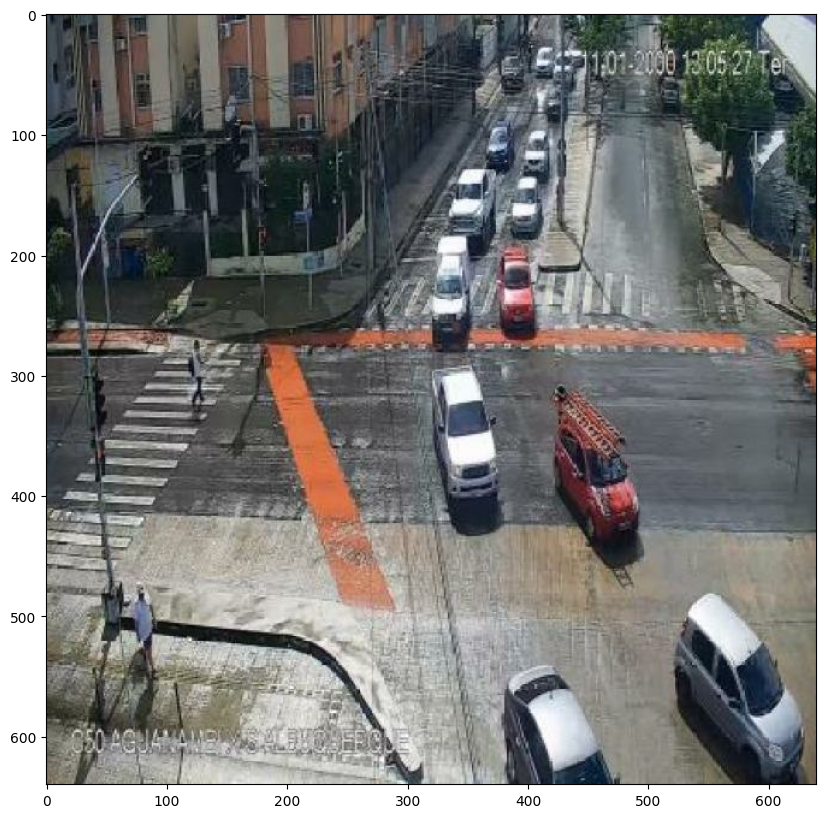

Visualizing predictions for val dataset, image 4


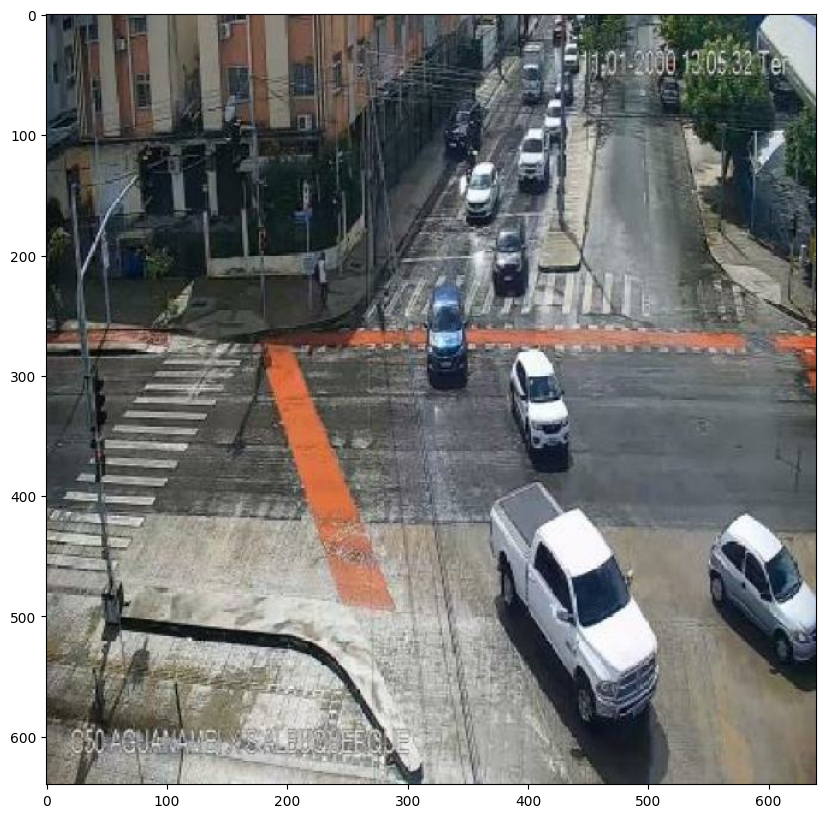

In [ ]:
# Function to visualize predictions on a single dataset (train or val)
def visualize_dataset_predictions(dataset, dataset_name, model, grid_size=20, img_size=640):
    """
    Visualize predictions on one image from a dataset.
    Args:
        dataset: The dataset (train_dataset or val_dataset).
        dataset_name: Name of the dataset (e.g., "train" or "val").
        model: The trained YOLO model.
        grid_size: The size of the YOLO grid.
        img_size: Size of the input image.
    """
    class_names = ['bicycle', 'bus', 'car', 'motorbike', 'person']  # Class names

    for images, _ in dataset.take(1):  # Take one batch from the dataset
        predictions = model.predict(images)
        for i in range(len(images)):
            print(f"Visualizing predictions for {dataset_name} dataset, image {i + 1}")
            decoded_boxes = decode_predictions(predictions[i], grid_size=grid_size, num_classes=5, img_size=img_size)
            final_boxes = non_max_suppression(decoded_boxes)
            plot_predictions(images[i].numpy(), final_boxes.numpy(), class_names)
        break  # Only process one batch

# Visualize predictions on one image from the train and val datasets
visualize_dataset_predictions(train_dataset, "train", model)
visualize_dataset_predictions(val_dataset, "val", model)


# Conclusión
Se implementa un modelo básico de detección de objetos utilizando la arquitectura YOLO. Se utiliza TensorFlow y Keras para construir el modelo, preprocesar las imágenes y etiquetas, y entrenar el modelo de manera eficiente. Se han integrado técnicas como la precisión mixta para mejorar el rendimiento y la supresión de no máximos para optimizar las predicciones.

Este enfoque puede ser mejorado con la implementación de técnicas más avanzadas para la localización de los objetos y la clasificación precisa, así como con la optimización de la función de pérdida para utilizar métricas más específicas, como el mAP (mean Average Precision), en lugar de MSE.

Aunque se ha implementado el modelo, aún no se han podido realizar predicciones precisas. Se sigue trabajando en la solución del modelo para lograr que realice predicciones correctas y optimizadas, ajustando parámetros y técnicas adicionales en el proceso.

In [ ]:
# Debug raw predictions
for images, _ in train_dataset.take(1):
    predictions = model.predict(images)
    print("Raw Predictions for First Image:", predictions[0])  # Print raw predictions for the first image


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Raw Predictions for First Image: [[[[0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 1.8568e-03
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]]

  [[0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 2.3689e-03
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]]

  [[5.9605e-08 0.0000e+00 0.0000e+00 ... 2.9302e-04 2.8789e-05
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]]

  ...

  [[3.4618e-03 0.0000e+00 0.0000e+00 ... 1.8282e-03 2.3842e-07
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000e+00 0.0000e+00
    0.0000e+00]
   [0.0000e+00 0.0000e+00 0.0000e+00 ... 0.0000

In [ ]:
# Debug NMS
final_boxes = non_max_suppression(decoded_boxes)
print("Final Boxes after NMS:", final_boxes.numpy())


Final Boxes after NMS: []
